# Make movies of tracer from high res 1km runs.

In [1]:
# load appropriate modules
import numpy as np
import xarray as xr
from xmitgcm import open_mdsdataset
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
from xgcm import Grid
import xrft
import os

In [2]:
# load data 

npick = 24 # pick up every npick'th file as the original out is very dense (12 hours)
dt_out = 90
T1 = 0
T2months = 118800
iters = range(T1+dt_out, T2months-dt_out, dt_out*npick)

data_dir = '/swot/SUM04/dbalwada/channel_beta/01km/tracer_exp2/' 
ds_tracer = open_mdsdataset(data_dir, delta_t=40, iters= iters, prefix=['U', 'V']
                     ,ignore_unknown_vars=True, geometry='cartesian')

/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/mds_store.py:220: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


In [3]:
npick = 24 # pick up every npick'th file as the original out is very dense (12 hours)
dt_out = 90
T1 = 118800
T2months = 118800
iters = range(T1+dt_out, T2months, dt_out*npick)

data_dir = '/swot/SUM04/dbalwada/channel_beta/01km/tracer_exp2_daily_out/' 
ds_tracer_2 = open_mdsdataset(data_dir, delta_t=40,  prefix=['U','V']
                     ,ignore_unknown_vars=True, geometry='cartesian')

/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/mds_store.py:696: UserWarning: Couldn't find available_diagnostics.log in /swot/SUM04/dbalwada/channel_beta/01km/tracer_exp2_daily_out/. Using default version.
  "in %s. Using default version." % data_dir)
/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/mds_store.py:220: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


In [4]:
ds_daily = xr.concat([ds_tracer, ds_tracer_2],dim='time',coords='minimal')

In [5]:
ds_daily

<xarray.Dataset>
Dimensions:              (XC: 2000, XG: 2000, YC: 2000, YG: 2000, Z: 76, Zl: 76, Zp1: 77, Zu: 76, layer_1TH_bounds: 43, layer_1TH_center: 42, layer_1TH_interface: 41, time: 106)
Coordinates:
  * XG                   (XG) >f4 0.0 1000.0 2000.0 3000.0 4000.0 5000.0 ...
  * YC                   (YC) >f4 500.0 1500.0 2500.0 3500.0 4500.0 5500.0 ...
  * YG                   (YG) >f4 0.0 1000.0 2000.0 3000.0 4000.0 5000.0 ...
  * XC                   (XC) >f4 500.0 1500.0 2500.0 3500.0 4500.0 5500.0 ...
  * Z                    (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 ...
  * Zp1                  (Zp1) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 ...
  * Zl                   (Zl) >f4 0.0 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 ...
  * Zu                   (Zu) >f4 -1.0 -2.14 -3.44 -4.93 -6.63 -8.56 -10.76 ...
    rAs                  (YG, XC) >f4 1e+06 1e+06 1e+06 1e+06 1e+06 1e+06 ...
    Depth                (YC, XC) >f4 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ...
    dyC  

In [13]:
# Load data # Hourly.
iters = range(90, 126540, 90)
ds1 = open_mdsdataset(data_dir,iters=iters, delta_t=40, prefix=['T','U','V','W','PTRACER01','Eta']
                     ,ignore_unknown_vars=True, geometry='cartesian')
#ds2 = open_mdsdataset(spinup2_dir, delta_t=300, prefix=['U','V','T','W','Eta']
#                     ,ignore_unknown_vars=True, geometry='cartesian')


/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/utils.py:314: UserWarning: Not sure what to do with rlev = L
  warnings.warn("Not sure what to do with rlev = " + rlev)
/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/xmitgcm/mds_store.py:220: FutureWarning: iteration over an xarray.Dataset will change in xarray v0.11 to only include data variables, not coordinates. Iterate over the Dataset.variables property instead to preserve existing behavior in a forwards compatible manner.
  for vname in ds:


In [10]:
ds1.time

<xarray.DataArray 'time' (time: 1405)>
array([   3600,    7200,   10800, ..., 5050800, 5054400, 5058000])
Coordinates:
    iter     (time) int64 dask.array<shape=(1405,), chunksize=(1,)>
  * time     (time) int64 3600 7200 10800 14400 18000 21600 25200 28800 ...
Attributes:
    standard_name:  time
    axis:           T
    units:          seconds
    long_name:      Time
    calendar:       gregorian

# Plot fields for visual comparisons

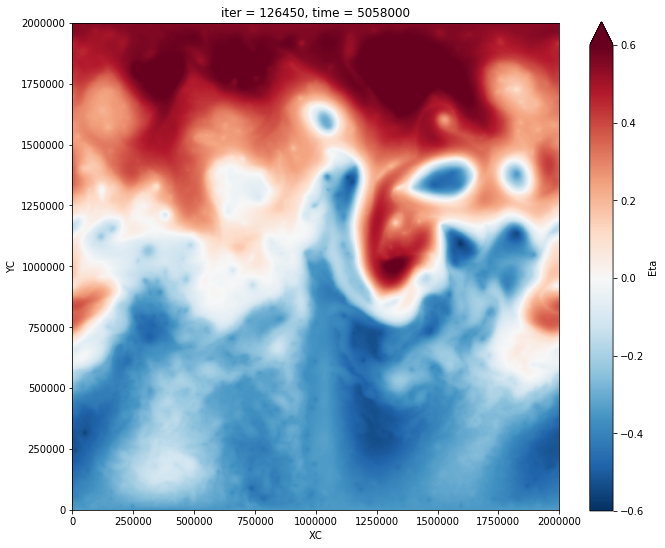

In [21]:
fig = plt.figure(figsize=(24,9))
ax =fig.add_subplot(121)
ds1.Eta.isel(time=-1).plot(vmin=-0.6)
ax.set_aspect('equal')

In [14]:
xlevs = [0,800e3]
ylevs = [600e3,1400e3]

In [15]:
Etaps2D = xrft.power_spectrum(ds1.Eta.isel(time=-1).sel(XC=slice(xlevs[0],xlevs[1]),
                                                     YC=slice(ylevs[0],ylevs[1])), 
                         dim = ['XC','YC'], window='hanning')

In [16]:
def azimuthal_avg(k, l, f, N, nfactor):
    """
    Takes the azimuthal average of a given field.
    """
    k = k.values; l = l.values
    kk, ll = np.meshgrid(k, l)
    K = np.sqrt(kk**2 + ll**2)
    nbins = int(N/nfactor)
    if k.max() > l.max():
        ki = np.linspace(0., l.max(), nbins)
    else:
        ki = np.linspace(0., k.max(), nbins)

    kidx = np.digitize(np.ravel(K), ki)
    area = np.bincount(kidx)

    kr = np.bincount(kidx, weights=K.ravel()) / area

    if f.ndim == 2:
        iso_f = np.ma.masked_invalid(np.bincount(kidx,
                                    weights=f.data.ravel())
                                    / area) * kr
    else:
        raise ValueError('The data has too many or few dimensions. '
                        'The input should only have the two dimensions '
                        'to take the azimuthal averaging over.')

    return kr, iso_f

In [17]:
nt = -1
krEta, Etapsiso = azimuthal_avg(Etaps2D.freq_XC, Etaps2D.freq_YC, Etaps2D, 
                            len(Etaps2D.freq_XC),4 )



/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/home/dbalwada/miniconda/envs/dhruvenv/lib/python3.5/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide


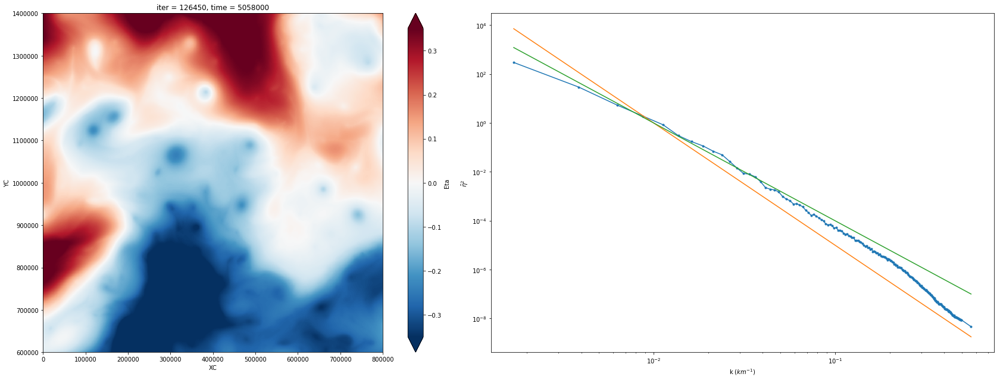

In [18]:
fig = plt.figure(figsize=(24,9))
ax =fig.add_subplot(121)
ds1.Eta.isel(time=-1).sel(XC=slice(xlevs[0],xlevs[1]),
                          YC=slice(ylevs[0],ylevs[1])).plot(vmin=-0.35)
ax.set_aspect('equal')

plt.subplot(122)
plt.plot(krEta*1e3, Etapsiso,'.-')
plt.tight_layout()

PL5 = 1e-25*krEta**(-5)
PL4 = 1e-20*krEta**(-4)

plt.plot(krEta*1e3, PL5, label='$k^{-5}$')
plt.plot(krEta*1e3, PL4, label='$k^{-4}$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k ($km^{-1}$)')
plt.ylabel('$\hat{\eta}^2$')

plt.tight_layout()

Text(18.75,0.5,'$\\hat{\\eta}^2$')

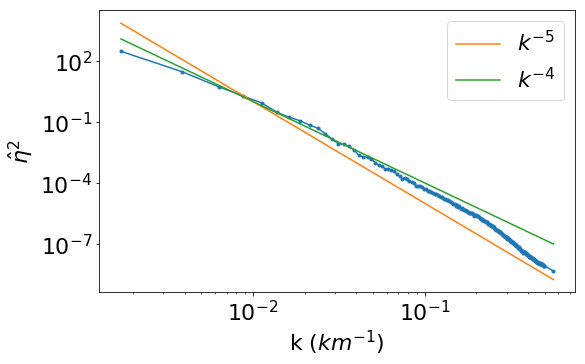

In [22]:
plt.figure(figsize=(8,5))
plt.rcParams.update({'font.size': 22})


plt.subplot(111)
plt.plot(krEta*1e3, Etapsiso,'.-')
plt.tight_layout()

PL5 = 1e-25*krEta**(-5)
PL4 = 1e-20*krEta**(-4)

plt.plot(krEta*1e3, PL5, label='$k^{-5}$')
plt.plot(krEta*1e3, PL4, label='$k^{-4}$')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlabel('k ($km^{-1}$)')
plt.ylabel('$\hat{\eta}^2$')


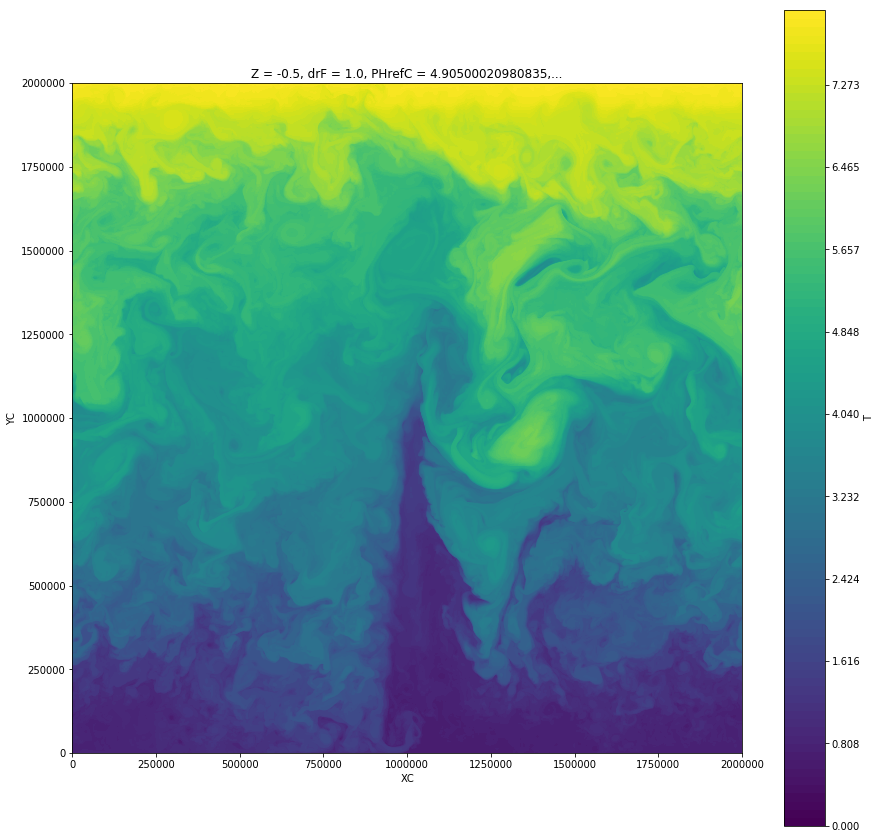

In [6]:
levels = np.linspace(0,8,100)
fig = plt.figure(figsize=(15,15))
ax =fig.add_subplot(111)
ds1['T'].isel(time=-1, Z=0).plot.contourf(levels=levels)
#ds1['T'].isel(time=1, Z=0).plot.contour(colors='k',levels=np.array(range(0,24))/2.)
ax.set_aspect('equal')
#ax =fig.add_subplot(122)
#ds2['T'].isel(time=-1, Z=0).plot.contourf(levels=levels)
#ds2['T'].isel(time=-1, Z=0).plot.contour(colors='k',levels=np.array(range(0,32))/2.)
#ax.set_aspect('equal')


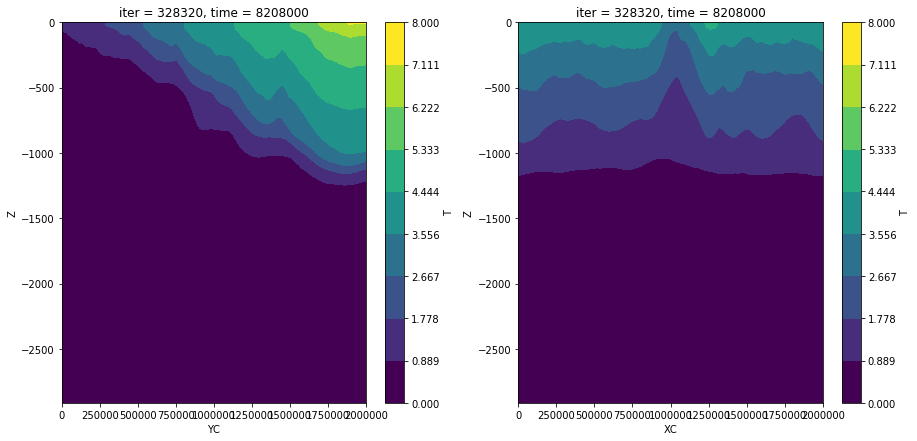

In [7]:
levels = np.linspace(0,8,10)
fig = plt.figure(figsize=(15,7))
ax =fig.add_subplot(121)
ds1['T'].isel(time=-1).mean('XC').plot.contourf(levels=levels)
ax =fig.add_subplot(122)
ds1['T'].isel(time=-1).mean('YC').plot.contourf(levels=levels)
#ax.set_aspect('equal')

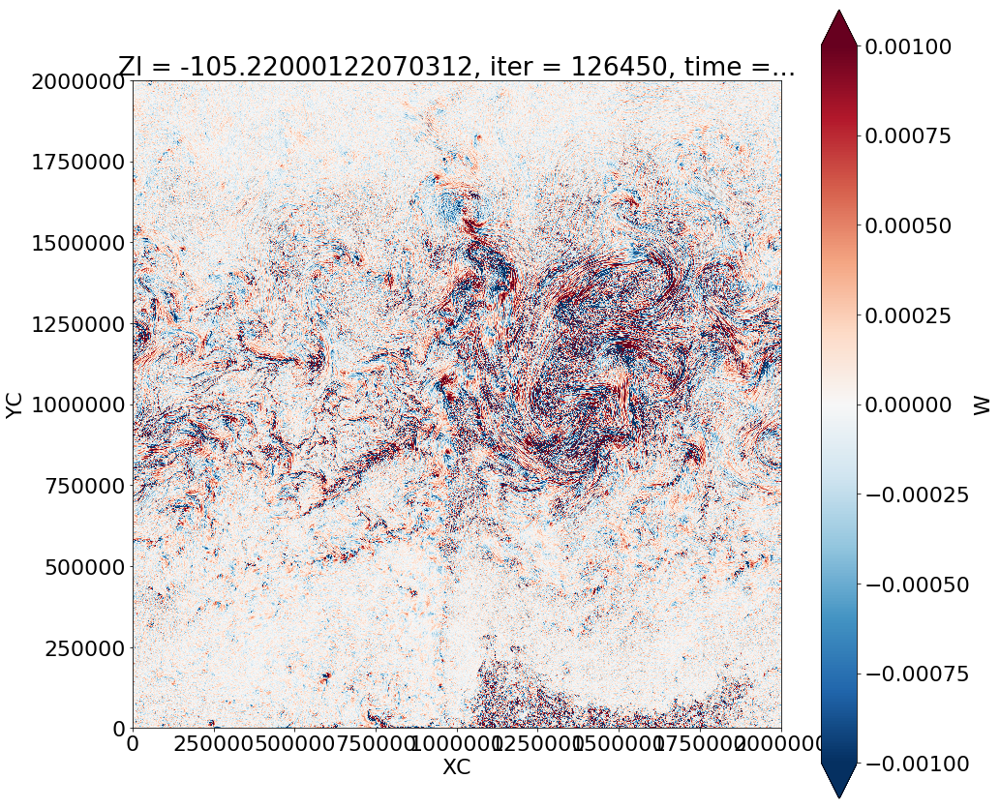

In [23]:
fig = plt.figure(figsize=(15,15))
ax =fig.add_subplot(111)
ds1['W'].isel(time=-1).sel(Zl=-100, method='nearest').plot(vmin=-0.001)
ax.set_aspect('equal')

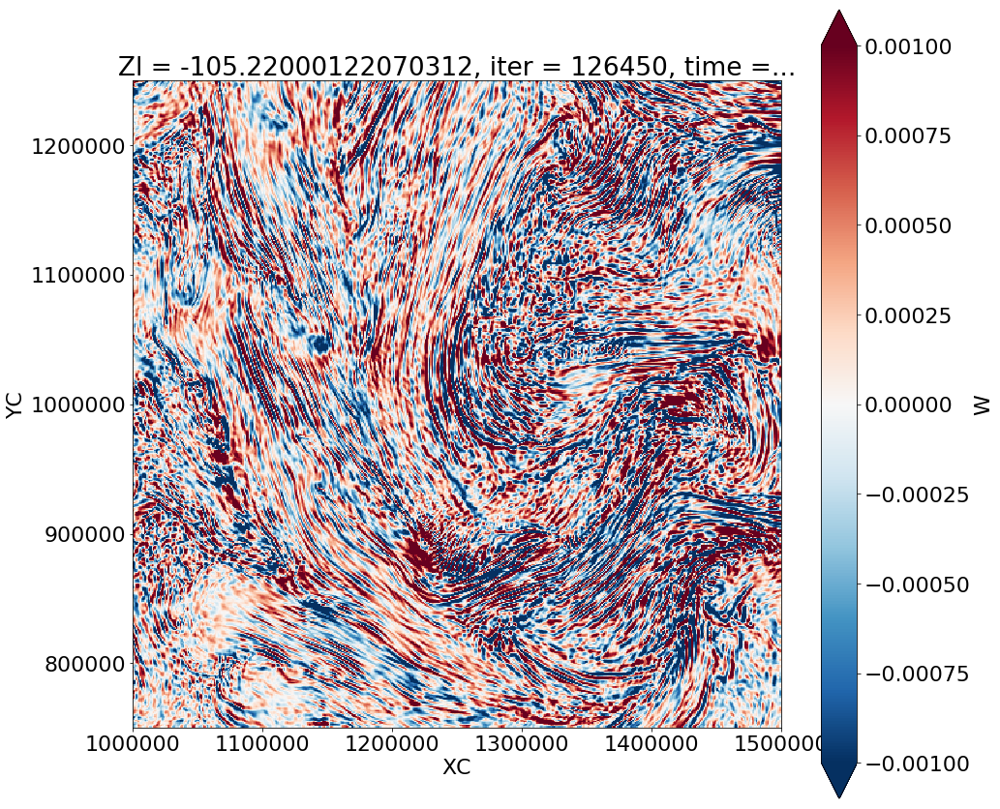

In [24]:
fig = plt.figure(figsize=(15,15))
ax =fig.add_subplot(111)
ds1['W'].isel(time=-1).sel(Zl=-100, method='nearest').sel(XC=slice(1000e3,1500e3),
                                                          YC=slice(750e3,1250e3)
                                                         ).plot(vmin=-0.001)
ax.set_aspect('equal')

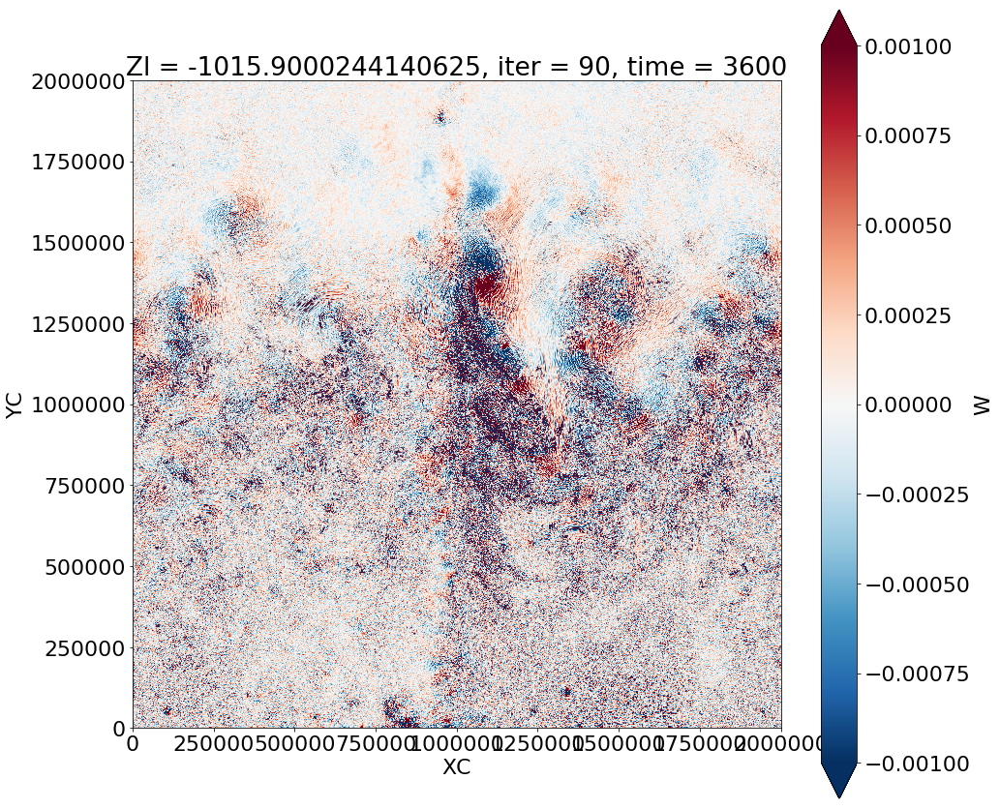

In [25]:
fig = plt.figure(figsize=(15,15))

ax =fig.add_subplot(111)
ds1['W'].isel(time=0).sel(Zl=-1000, method='nearest').plot(vmin=-0.001)
ax.set_aspect('equal')

In [30]:
ds1['PTRACER01']

<xarray.DataArray 'PTRACER01' (time: 1405, Z: 76, YC: 2000, XC: 2000)>
dask.array<shape=(1405, 76, 2000, 2000), dtype=float32, chunksize=(1, 76, 2000, 2000)>
Coordinates:
  * XC       (XC) >f4 500.0 1500.0 2500.0 3500.0 4500.0 5500.0 6500.0 7500.0 ...
  * YC       (YC) >f4 500.0 1500.0 2500.0 3500.0 4500.0 5500.0 6500.0 7500.0 ...
  * Z        (Z) >f4 -0.5 -1.57 -2.79 -4.185 -5.78 -7.595 -9.66 -12.01 ...
    Depth    (YC, XC) >f4 dask.array<shape=(2000, 2000), chunksize=(2000, 2000)>
    rA       (YC, XC) >f4 dask.array<shape=(2000, 2000), chunksize=(2000, 2000)>
    PHrefC   (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    drF      (Z) >f4 dask.array<shape=(76,), chunksize=(76,)>
    hFacC    (Z, YC, XC) >f4 dask.array<shape=(76, 2000, 2000), chunksize=(76, 2000, 2000)>
    iter     (time) int64 dask.array<shape=(1405,), chunksize=(1,)>
  * time     (time) int64 3600 7200 10800 14400 18000 21600 25200 28800 ...
Attributes:
    standard_name:  PTRACER01_concentration
    units:    

Text(0.5,1,'Depth - 150m')

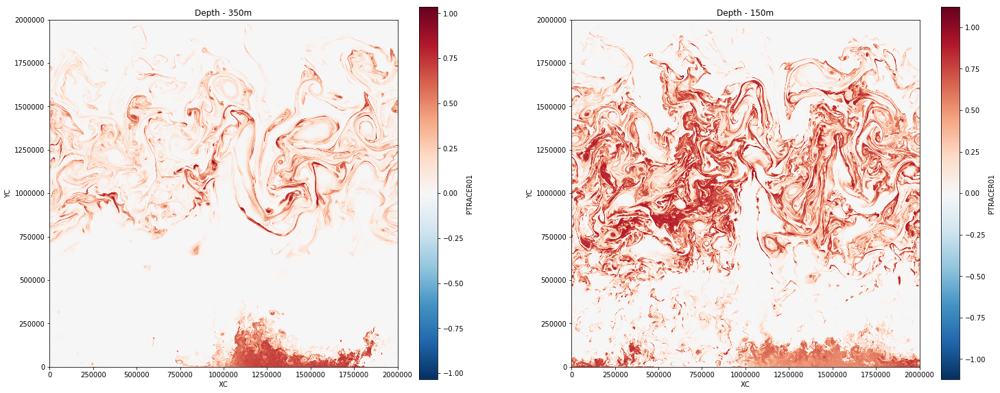

In [32]:
fig = plt.figure(figsize=(25,10))
ax =fig.add_subplot(121)
ds1['PTRACER01'].isel(time=-1).sel(Z=-350,method='nearest').plot()
#ds1['T'].isel(time=1, Z=0).plot.contour(colors='k',levels=np.array(range(0,24))/2.)
ax.set_aspect('equal')
plt.title('Depth - 350m')

ax =fig.add_subplot(122)
ds1['PTRACER01'].isel(time=700).sel(Z=-150,method='nearest').plot()
#ds1['T'].isel(time=1, Z=0).plot.contour(colors='k',levels=np.array(range(0,24))/2.)
ax.set_aspect('equal')
plt.title('Depth - 150m')
#ax =fig.add_subplot(122)
#ds2['T'].isel(time=-1, Z=0).plot.contourf(levels=levels)
#ds2['T'].isel(time=-1, Z=0).plot.contour(colors='k',levels=np.array(range(0,32))/2.)
#ax.set_aspect('equal')


In [ ]:
len(ds1.time)

In [41]:
(ds1.time[n] - ds1.time[0])/24/3600

<xarray.DataArray 'time' ()>
array(16.666666666666668)

In [ ]:
fig = plt.figure(figsize=(25,10))
plt.rcParams.update({'font.size': 16})


for n in range(0, len(ds1.time)):
    plt.clf()
   
    ax =fig.add_subplot(121)
    ds1['PTRACER01'].isel(time=n).sel(Z=-350,method='nearest').plot(vmin=-1)
    ax.set_aspect('equal')
    plt.title('Depth - 350m')

    ax =fig.add_subplot(122)
    ds1['PTRACER01'].isel(time=n).sel(Z=-150,method='nearest').plot(vmin=-1)
    ax.set_aspect('equal')
    plt.title('Depth - 150m')
    #ax =fig.add_subplot(122)
    plt.suptitle(str(int((ds1.time[n] - ds1.time[0])/24/3600)) + ' days')
    plt.tight_layout()

    plt.savefig('/swot/SUM05/dbalwada/channel_beta/movie_tracer_2depths/frame_%05d.png' % n)

Text(0.5,1,'')

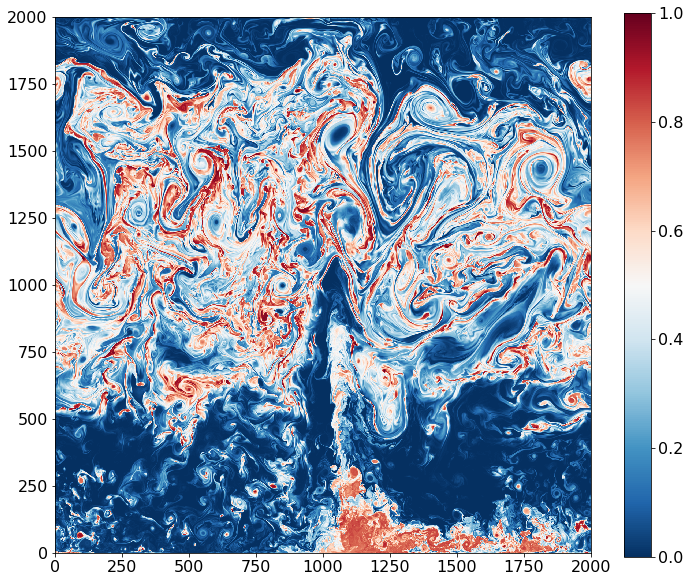

In [17]:
fig = plt.figure(figsize=(12,10))
plt.rcParams.update({'font.size': 16})

ax =fig.add_subplot(111)
plt.pcolor(tracer_daily['PTRACER01'].XC/1e3, tracer_daily['PTRACER01'].YC/1e3, 
         tracer_daily['PTRACER01'].isel(time=-1).sel(Z=-200,method='nearest'),vmin=0.0,vmax=1.0, cmap='RdBu_r')
#ds1['T'].isel(time=1, Z=0).plot.contour(colors='k',levels=np.array(range(0,24))/2.)
plt.colorbar()
ax.set_aspect('equal')
plt.title('')
#ax =fig.add_subplot(122)
#ds2['T'].isel(time=-1, Z=0).plot.contourf(levels=levels)
#ds2['T'].isel(time=-1, Z=0).plot.contour(colors='k',levels=np.array(range(0,32))/2.)
#ax.set_aspect('equal')


Text(0.5,1,'')

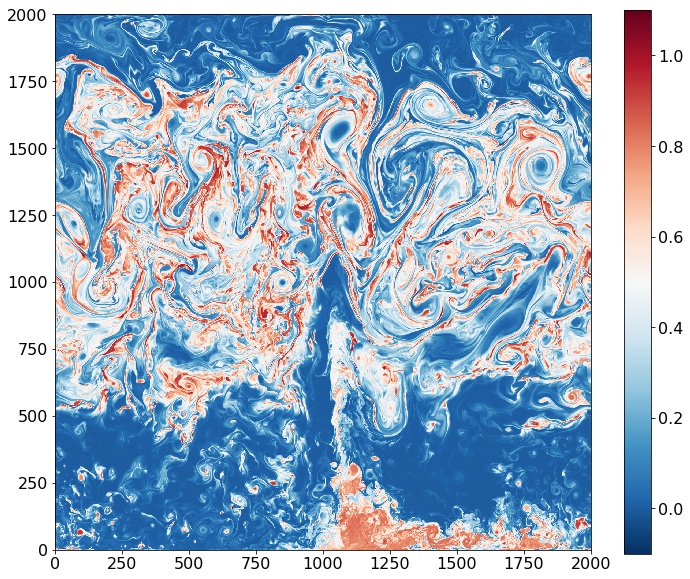

In [15]:
fig = plt.figure(figsize=(12,10))
plt.rcParams.update({'font.size': 16})

ax =fig.add_subplot(111)
plt.pcolor(tracer_daily['PTRACER01'].XC/1e3, tracer_daily['PTRACER01'].YC/1e3, 
         tracer_daily['PTRACER01'].isel(time=-1).sel(Z=-200,method='nearest'),vmin=-0.1,vmax=1.1, cmap='RdBu_r')
#ds1['T'].isel(time=1, Z=0).plot.contour(colors='k',levels=np.array(range(0,24))/2.)
plt.colorbar()
ax.set_aspect('equal')
plt.title('')
#ax =fig.add_subplot(122)
#ds2['T'].isel(time=-1, Z=0).plot.contourf(levels=levels)
#ds2['T'].isel(time=-1, Z=0).plot.contour(colors='k',levels=np.array(range(0,32))/2.)
#ax.set_aspect('equal')


Text(0.5,1,'')

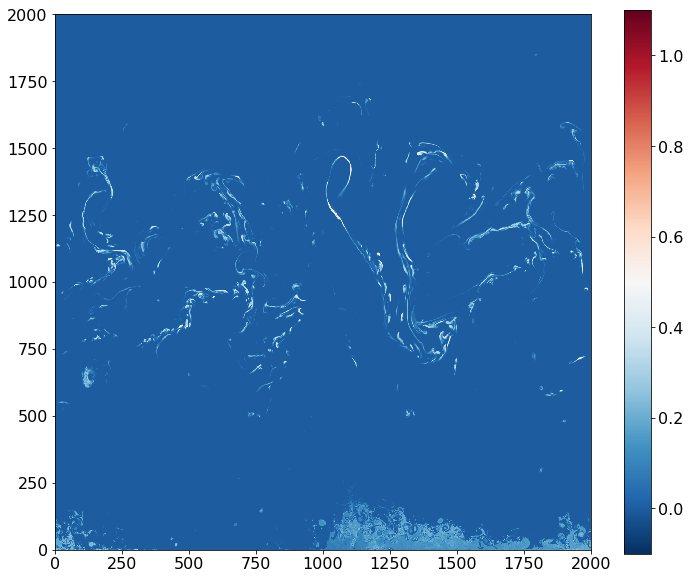

In [16]:
fig = plt.figure(figsize=(12,10))
plt.rcParams.update({'font.size': 16})

ax =fig.add_subplot(111)
plt.pcolor(tracer_daily['PTRACER01'].XC/1e3, tracer_daily['PTRACER01'].YC/1e3, 
         tracer_daily['PTRACER01'].isel(time=5).sel(Z=-200,method='nearest'),vmin=-0.1,vmax=1.1, cmap='RdBu_r')
plt.colorbar()
ax.set_aspect('equal')
plt.title('')


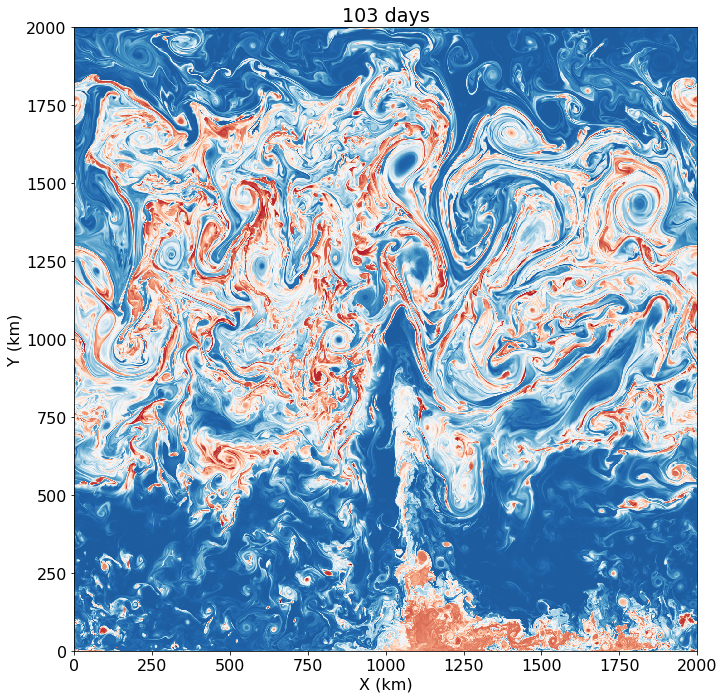

In [19]:
fig = plt.figure(figsize=(12,10))
plt.rcParams.update({'font.size': 16})


for n in  range(0, len(tracer_daily.time)):
    plt.clf()
   
 
    ax =fig.add_subplot(111)
    plt.pcolor(tracer_daily['PTRACER01'].XC/1e3, tracer_daily['PTRACER01'].YC/1e3, 
             tracer_daily['PTRACER01'].isel(time=n).sel(Z=-200,method='nearest'),vmin=-0.1,vmax=1.1, cmap='RdBu_r')
    ax.set_aspect('equal')
    plt.title(str(int((tracer_daily.time[n] - tracer_daily.time[0])/24/3600)) + ' days')

    plt.xlabel('X (km)')
    plt.ylabel('Y (km)')
    
    plt.tight_layout()

    plt.savefig('/swot/SUM05/dbalwada/channel_beta/movie_tracer_red_blues_daily/frame_%05d.png' % n)

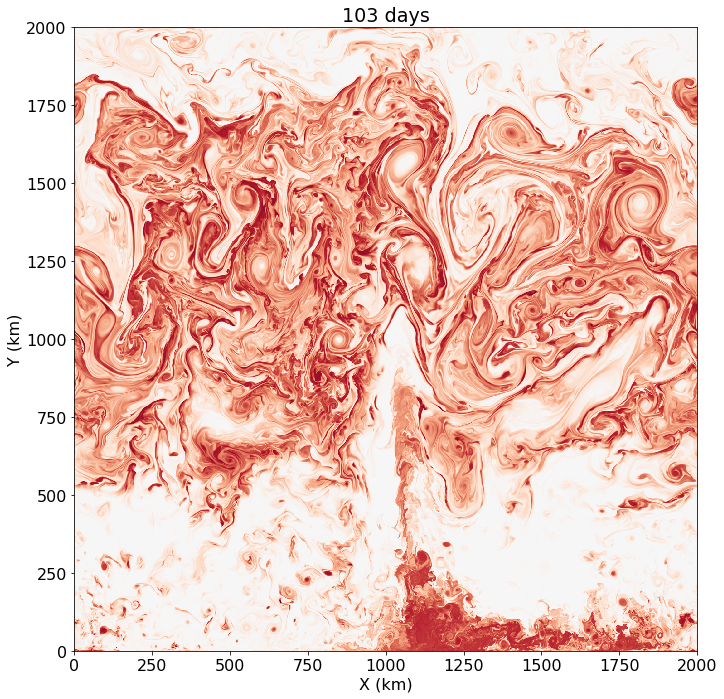

In [22]:
fig = plt.figure(figsize=(12,10))
plt.rcParams.update({'font.size': 16})


for n in  range(0, len(tracer_daily.time)):
    plt.clf()
   
 
    ax =fig.add_subplot(111)
    plt.pcolor(tracer_daily['PTRACER01'].XC/1e3, tracer_daily['PTRACER01'].YC/1e3, 
             tracer_daily['PTRACER01'].isel(time=n).sel(Z=-200,method='nearest'),vmin=-1.1,vmax=1.1, cmap='RdBu_r')
    ax.set_aspect('equal')
    plt.title(str(int((tracer_daily.time[n] - tracer_daily.time[0])/24/3600)) + ' days')

    plt.xlabel('X (km)')
    plt.ylabel('Y (km)')
    
    plt.tight_layout()

    plt.savefig('/swot/SUM05/dbalwada/channel_beta/movie_tracer_red_daily/frame_%05d.png' % n)

In [7]:
# Make vorticity movies. 

# Velocity PDFs, vorticity PDFs. 
f0=-0.83E-04
beta=1.87E-11


grid = Grid(ds_daily, periodic='X')
    
f = f0 + beta*ds_daily.YC
    
dx = ds_daily.dxG[0,0]
dy = ds_daily.dxG[0,0]
    # dv/dx - du/dy
vorticity = ( grid.interp(grid.diff(grid.interp(ds_daily.V, 'Y', boundary='extend'), 'X'), 'X')/dx - 
                  grid.interp(grid.diff(grid.interp(ds_daily.U, 'X'), 'Y', boundary='extend'), 'Y',boundary='extend') 
                  /dy)/f 

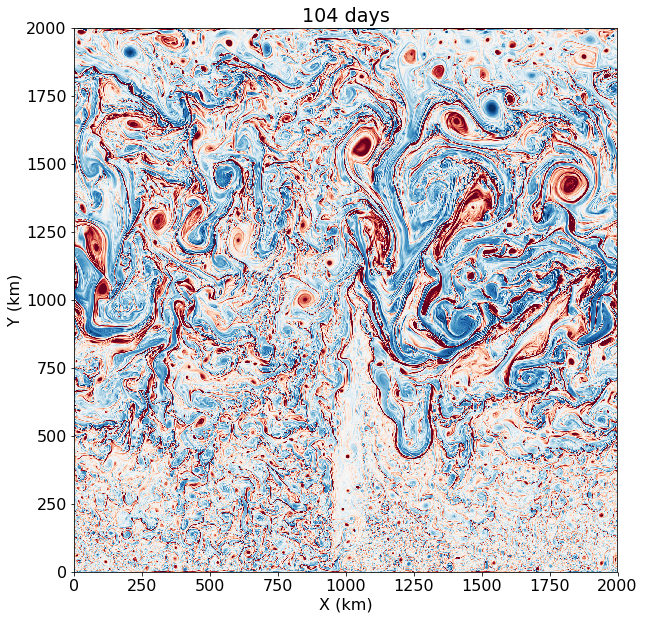

In [ ]:
fig = plt.figure(figsize=(12,10))
plt.rcParams.update({'font.size': 16})


for n in  range(0, len(vorticity.time)):
    plt.clf()
   
    ax =fig.add_subplot(111)

    plt.pcolor(vorticity.XC/1e3, vorticity.YC/1e3, 
                 vorticity.isel(time=n, Z=0), vmin=-1.,vmax=1., cmap='RdBu_r')
    plt.xlabel('X (km)')
    plt.ylabel('Y (km)')
    plt.title(str(int((vorticity.time[n] - vorticity.time[0])/24/3600)) + ' days')
    ax.set_aspect('equal')

    plt.tight_layout
    
    plt.savefig('/swot/SUM05/dbalwada/channel_beta/movie_vorticity/frame_%05d.png' % n, dpi=100)

In [ ]:
vorticity